# Correlation Analysis

In [1]:
import pandas as pd
import numpy as np

from matplotlib import pyplot as plt
import seaborn as sb


# Set the ggplot style (optional)
plt.style.use("ggplot")

In [2]:
# OJO que esto es para los estudiantes de matemáticas
df_merged = pd.read_csv('student/merged_students.csv', delimiter=';')
#df_merged = pd.read_csv('student/student-por.csv', delimiter=';')

In [3]:
df_merged.head()

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,...,Dalc,Walc,health,studytime,failures,schoolsup,famsup,higher,absences,activities
0,GP,F,18,U,GT3,A,4,4,at_home,teacher,...,1,1,3,2,0,yes,no,yes,6,no
1,GP,F,17,U,GT3,T,1,1,at_home,other,...,1,1,3,2,0,no,yes,yes,4,no
2,GP,F,15,U,LE3,T,1,1,at_home,other,...,2,3,3,2,3,yes,no,yes,10,no
3,GP,F,15,U,GT3,T,4,2,health,services,...,1,1,5,3,0,no,yes,yes,2,yes
4,GP,F,16,U,GT3,T,3,3,other,other,...,1,2,5,2,0,no,yes,yes,4,no


In [4]:
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 382 entries, 0 to 381
Data columns (total 37 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   school      382 non-null    object
 1   sex         382 non-null    object
 2   age         382 non-null    int64 
 3   address     382 non-null    object
 4   famsize     382 non-null    object
 5   Pstatus     382 non-null    object
 6   Medu        382 non-null    int64 
 7   Fedu        382 non-null    int64 
 8   Mjob        382 non-null    object
 9   Fjob        382 non-null    object
 10  reason      382 non-null    object
 11  paid_mat    382 non-null    object
 12  nursery     382 non-null    object
 13  internet    382 non-null    object
 14  G1_mat      382 non-null    int64 
 15  G2_mat      382 non-null    int64 
 16  G3_mat      382 non-null    int64 
 17  paid_por    382 non-null    object
 18  G1_por      382 non-null    int64 
 19  G2_por      382 non-null    int64 
 20  G3_por    

In [5]:
df_merged.describe()

,age,Medu,Fedu,G1_mat,G2_mat,G3_mat,G1_por,G2_por,G3_por,traveltime,famrel,freetime,goout,Dalc,Walc,health,studytime,failures,absences
count,382.000000,382.000000,382.000000,382.000000,382.000000,382.000000,382.000000,382.000000,382.000000,382.000000,382.000000,382.000000,382.000000,382.000000,382.000000,382.000000,382.000000,382.000000,382.000000
mean,16.586387,2.806283,2.565445,10.861257,10.712042,10.387435,12.112565,12.238220,12.515707,1.442408,3.939791,3.222513,3.112565,1.473822,2.280105,3.578534,2.034031,0.290576,5.319372
std,1.173470,1.086381,1.096240,3.349167,3.832560,4.687242,2.556531,2.468341,2.945438,0.695378,0.921620,0.988233,1.131927,0.886229,1.282866,1.400360,0.845798,0.729481,7.625251
min,15.000000,0.000000,0.000000,3.000000,0.000000,0.000000,0.000000,5.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000
25%,16.000000,2.000000,2.000000,8.000000,8.250000,8.000000,10.000000,11.000000,11.000000,1.000000,4.000000,3.000000,2.000000,1.000000,1.000000,3.000000,1.000000,0.000000,0.000000
50%,17.000000,3.000000,3.000000,10.500000,11.000000,11.000000,12.000000,12.000000,13.000000,1.000000,4.000000,3.000000,3.000000,1.000000,2.000000,4.000000,2.000000,0.000000,3.000000
75%,17.000000,4.000000,4.000000,13.000000,13.000000,14.000000,14.000000,14.000000,14.000000,2.000000,5.000000,4.000000,4.000000,2.000000,3.000000,5.000000,2.000000,0.000000,8.000000
max,22.000000,4.000000,4.000000,19.000000,19.000000,20.000000,19.000000,19.000000,19.000000,4.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,4.000000,3.000000,75.000000


**Basic cleaning or processing**

In the table above, some things seem weird. The minimum height is 1.63 and the maximum height is 364.0. Probably some fantasy figures, one apparently also with shoe size 88. This are typical issues we can quickly discover in a first inspection and then decide what to do about it. Here, we will simply decide to only take data within more or less realistic boundaries. 

**Question:** What does that actually mean?

Instead of as a matrix with values, the correlation matrix is often also graphically represented, especially for larger datasets, to easily spot particularly high and low coefficients.

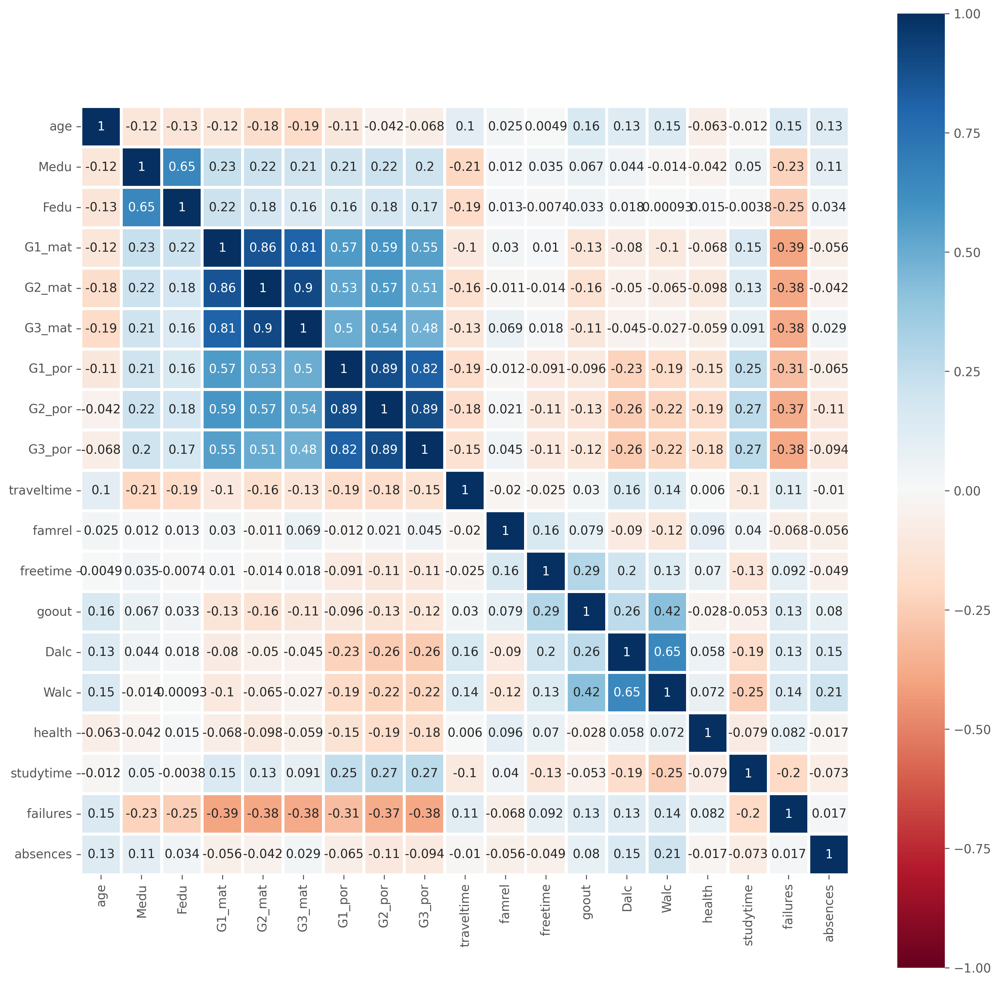

In [6]:
fig, ax = plt.subplots(figsize=(14, 14), dpi=300) 


sb.heatmap(
    df_merged.corr(numeric_only=True), 
    vmin=-1, vmax=1,
    square=True, lw=2,
    annot=True, cmap="RdBu",
    ax=ax,
)
plt.show()

# PREPRACIÓN DEL DATASET

In [7]:
import pandas as pd
import numpy as np

from matplotlib import pyplot as plt
import seaborn as sb


# Set the ggplot style (optional)
plt.style.use("ggplot")

In [8]:
df_merged = pd.read_csv('student/merged_students.csv', delimiter=';')

In [9]:
new_df_merged = df_merged.copy()

# Elimino G1 y G2 poque G3 es la media
new_df_merged.drop(['G1_mat', 'G2_mat'], axis=1, inplace=True)
# Elimino G1 y G2 poque G3 es la media
new_df_merged.drop(['G1_por', 'G2_por'], axis=1, inplace=True)

# Agrego el consumo de alcohol
new_df_merged.drop(['Dalc', 'Walc'], axis=1, inplace=True)
new_df_merged['Malcohol'] = (df_merged['Walc'] + df_merged['Dalc'])/2

# Agrego la formación paternal
new_df_merged.drop(['Fedu', 'Medu'], axis=1, inplace=True)
new_df_merged['Edu'] = df_merged['Fedu'] + df_merged['Medu']

df_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 382 entries, 0 to 381
Data columns (total 37 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   school      382 non-null    object
 1   sex         382 non-null    object
 2   age         382 non-null    int64 
 3   address     382 non-null    object
 4   famsize     382 non-null    object
 5   Pstatus     382 non-null    object
 6   Medu        382 non-null    int64 
 7   Fedu        382 non-null    int64 
 8   Mjob        382 non-null    object
 9   Fjob        382 non-null    object
 10  reason      382 non-null    object
 11  paid_mat    382 non-null    object
 12  nursery     382 non-null    object
 13  internet    382 non-null    object
 14  G1_mat      382 non-null    int64 
 15  G2_mat      382 non-null    int64 
 16  G3_mat      382 non-null    int64 
 17  paid_por    382 non-null    object
 18  G1_por      382 non-null    int64 
 19  G2_por      382 non-null    int64 
 20  G3_por    

In [10]:
df_merged = pd.get_dummies(df_merged, drop_first=False)

# Seleccionamos todas las columnas (todas ahora son numéricas)
numeric_cols = df_merged.select_dtypes(include=['float64', 'int64', 'bool']).columns

In [11]:
fig, ax = plt.subplots(figsize=(50, 50), dpi=300) 

sb.heatmap(
    df_merged.corr(numeric_only=True), 
    vmin=-1, vmax=1,
    square=True, lw=2,
    annot=True, cmap="RdBu",
    ax=ax,
)
plt.show()

In [17]:
# Calcular la correlación de todas las variables con G3_mat y G3_por
correlacion_G3_mat = df_merged.corr()['G3_mat'].sort_values(ascending=False)
correlacion_G3_por = df_merged.corr()['G3_por'].sort_values(ascending=False)

# Crear un DataFrame con ambas correlaciones
correlaciones = pd.DataFrame({
    'Correlacion con G3_mat': correlacion_G3_mat,
    'Correlacion con G3_por': correlacion_G3_por,
    'Desviacion': correlacion_G3_mat - correlacion_G3_por
})


# Imprimir el resultado
print("Correlación de cada variable con G3_mat y G3_por, y su desviación estándar:")
print(correlaciones)

# Guardar el DataFrame en un archivo JSON
correlaciones.to_json('correlaciones.json', orient='index', indent=4)

# Confirmación de guardado
print("Archivo JSON creado: correlaciones.json")

Correlación de cada variable con G3_mat y G3_por, y su desviación estándar:
               Correlacion con G3_mat  Correlacion con G3_por  Desviacion
Dalc                        -0.044941               -0.264789    0.219849
Fedu                         0.155444                0.172009   -0.016565
Fjob_at_home                -0.028471                0.083289   -0.111761
Fjob_health                  0.052649                0.026900    0.025749
Fjob_other                  -0.046952               -0.056938    0.009986
...                               ...                     ...         ...
schoolsup_yes               -0.075237               -0.144695    0.069458
sex_F                       -0.121671                0.201064   -0.322735
sex_M                        0.121671               -0.201064    0.322735
studytime                    0.091339                0.272130   -0.180791
traveltime                  -0.126004               -0.153973    0.027968

[64 rows x 3 columns]
Archivo JSON 

La librería Pingouin tiene una de las implementaciones más completas. Con la función corr() se obtiene, además del coeficiente de correlación, su significancia, intervalo de confianza y poder estadístico entre otros. Fuente: https://cienciadedatos.net/documentos/pystats05-correlacion-lineal-python

In [ ]:
!pip install pingouin

Interpretación de penguin
- r, la correlación 
- p-val indica si se debe a una casualidad (p-val>0.05) o puede ser significativa (p-val<0.05).
- CI es el intervalo de confianza, que estás 95% seguro de que el verdadero coeficiente de correlación de la población se encuentra entre X1 y X2
- BF10, factor de Bayes que indica la fuerza de la evidencia a favor de la hipótesis alternativa (que hay una correlación) frente a la hipótesis nula (que no hay correlación). Un valor tan alto (más de 10) sugiere una evidencia muy fuerte en favor de la hipótesis alternativa.
- power, indica la probabilidad de encontrar una relación si existe.

In [91]:
# Cálculo de correlación, significancia e intervalos con pingouin
# ==============================================================================
display(pg.corr(df_port['failures'], df_port['G3'], method='pearson'))
#display(pg.corr(df_port['failures'], df_port['G3'], method='spearman'))
#display(pg.corr(df_port['failures'], df_port['G3'], method='kendall'))

,n,r,CI95%,p-val,BF10,power
pearson,395,-0.360415,"[-0.44, -0.27]",1.465663e-13,4.114e+10,1.0


,n,r,CI95%,p-val,power
spearman,395,-0.361224,"[-0.44, -0.27]",1.281880e-13,1.0


,n,r,CI95%,p-val,power
kendall,395,-0.299185,"[-0.39, -0.21]",6.366094e-13,0.999984


In [115]:
# Crear una lista para almacenar los resultados
correlation_results = []

df_encoded = pd.get_dummies(df_port, drop_first=True)  # drop_first evita la multicolinealidad

# Seleccionamos todas las columnas (todas ahora son numéricas)
numeric_cols = df_encoded.select_dtypes(include=['float64', 'int64', 'bool']).columns


# Iterar sobre todas las columnas del DataFrame
for column in numeric_cols:
    if column not in ['G3']:  # Excluir 'G3' de la comparación
        # Calcular la correlación de Pearson entre 'failures' y la columna actual
        correlation = pg.corr(df_encoded['G3'], df_encoded[column], method='pearson')
        
        # Almacenar los resultados en la lista
        correlation_results.append({
            'Variable': column,
            'r': correlation['r'].values[0],
            'p-val': correlation['p-val'].values[0],
            'n': correlation['n'].values[0],
            'CI95': correlation['CI95%'].values[0].tolist()
        })
        
correlation_df = pd.DataFrame(correlation_results)

# Mostrar los resultados
display(correlation_df)

,Variable,r,p-val,n,CI95
0,age,-0.161579,1.271439e-03,395,"[-0.26, -0.06]"
1,Medu,0.217147,1.336107e-05,395,"[0.12, 0.31]"
2,Fedu,0.152457,2.379973e-03,395,"[0.05, 0.25]"
3,traveltime,-0.117142,1.986983e-02,395,"[-0.21, -0.02]"
4,studytime,0.097820,5.206115e-02,395,"[-0.0, 0.19]"
5,failures,-0.360415,1.465663e-13,395,"[-0.44, -0.27]"
6,famrel,0.051363,3.085520e-01,395,"[-0.05, 0.15]"
7,freetime,0.011307,8.227402e-01,395,"[-0.09, 0.11]"
8,goout,-0.132791,8.229000e-03,395,"[-0.23, -0.03]"
9,Dalc,-0.054660,2.784915e-01,395,"[-0.15, 0.04]"


In [89]:
correlation_results = []

df_encoded = pd.get_dummies(df_port, drop_first=True)  # drop_first evita la multicolinealidad

# Seleccionamos todas las columnas (todas ahora son numéricas)
numeric_cols = df_encoded.select_dtypes(include=['float64', 'int64', 'bool']).columns

# Almacenamos los resultados en un DataFrame
correlation_results = []

# Iterar sobre cada columna numérica
for col in numeric_cols:
    if col != 'G3':  # Evitar calcular la correlación de G3 consigo mismo
        pearson_corr = pg.corr(df_encoded['G3'], df_encoded[col], method='pearson')
        spearman_corr = pg.corr(df_encoded['G3'], df_encoded[col], method='spearman')
        kendall_corr = pg.corr(df_encoded['G3'], df_encoded[col], method='kendall')
        
        # Guardar los resultados en una lista
        correlation_results.append({
            'Variable': col,
            'Pearson Correlation': pearson_corr['r'].values[0],
            'Pearson p-value': pearson_corr['p-val'].values[0],
            'Spearman Correlation': spearman_corr['r'].values[0],
            'Spearman p-value': spearman_corr['p-val'].values[0],
            'Kendall Correlation': kendall_corr['r'].values[0],
            'Kendall p-value': kendall_corr['p-val'].values[0],
        })

# Crear un DataFrame con los resultados
correlation_df = pd.DataFrame(correlation_results)

# Mostrar los resultados
display(correlation_df)

,Variable,Pearson Correlation,Pearson p-value,Spearman Correlation,Spearman p-value,Kendall Correlation,Kendall p-value
0,age,-0.161579,1.271439e-03,-0.173438,5.354722e-04,-0.134471,4.893167e-04
1,Medu,0.217147,1.336107e-05,0.225036,6.290448e-06,0.174766,8.280382e-06
2,Fedu,0.152457,2.379973e-03,0.170049,6.895636e-04,0.132405,7.030994e-04
3,traveltime,-0.117142,1.986983e-02,-0.120530,1.654591e-02,-0.098996,1.708821e-02
4,studytime,0.097820,5.206115e-02,0.105170,3.667358e-02,0.085112,3.379330e-02
5,failures,-0.360415,1.465663e-13,-0.361224,1.281880e-13,-0.299185,6.366094e-13
6,famrel,0.051363,3.085520e-01,0.054977,2.757107e-01,0.044007,2.716000e-01
7,freetime,0.011307,8.227402e-01,-0.004994,9.211901e-01,-0.003746,9.240350e-01
8,goout,-0.132791,8.229000e-03,-0.166119,9.192641e-04,-0.130110,8.182581e-04
9,Dalc,-0.054660,2.784915e-01,-0.120944,1.617510e-02,-0.097154,1.821330e-02


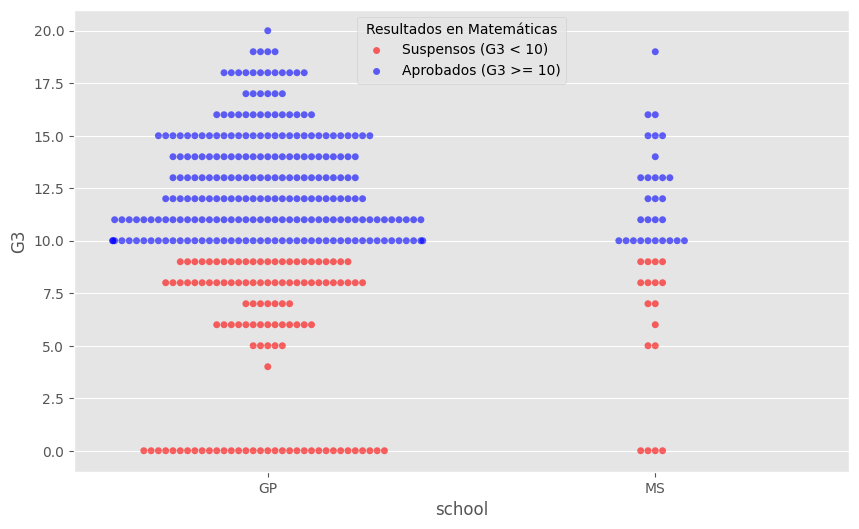

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,...,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
0,GP,F,18,U,GT3,A,4,4,at_home,teacher,...,4,3,4,1,1,3,6,5,6,6
1,GP,F,17,U,GT3,T,1,1,at_home,other,...,5,3,3,1,1,3,4,5,5,6
2,GP,F,15,U,LE3,T,1,1,at_home,other,...,4,3,2,2,3,3,10,7,8,10
3,GP,F,15,U,GT3,T,4,2,health,services,...,3,2,2,1,1,5,2,15,14,15
4,GP,F,16,U,GT3,T,3,3,other,other,...,4,3,2,1,2,5,4,6,10,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
390,MS,M,20,U,LE3,A,2,2,services,services,...,5,5,4,4,5,4,11,9,9,9
391,MS,M,17,U,LE3,T,3,1,services,services,...,2,4,5,3,4,2,3,14,16,16
392,MS,M,21,R,GT3,T,1,1,other,other,...,5,5,3,3,3,3,3,10,8,7
393,MS,M,18,R,LE3,T,3,2,services,other,...,4,4,1,3,4,5,0,11,12,10


In [87]:
# Crear una columna en `df_portç` para categorizar los puntos según el valor de G3
df_por['color'] = df_por['G3'].apply(lambda x: 'red' if x < 10 else 'blue')

# Crear el gráfico de puntos (swarmplot) con la nueva columna de color como hue
plt.figure(figsize=(10, 6))
sb.swarmplot(y="G3", x="school", data=df_por, hue="color", palette={'red': 'red', 'blue': 'blue'}, alpha=0.6)

# Añadir etiquetas a los ejes
plt.xlabel("school")
plt.ylabel("G3")

# Ajustar la leyenda y mostrar la gráfica
plt.legend(title='Resultados en Matemáticas', labels=['Suspensos (G3 < 10)', 'Aprobados (G3 >= 10)'])
plt.show()
df_por.drop(columns=['color'])

color   Aprobados  Suspensos
school                      
GP            236        113
MS             29         17


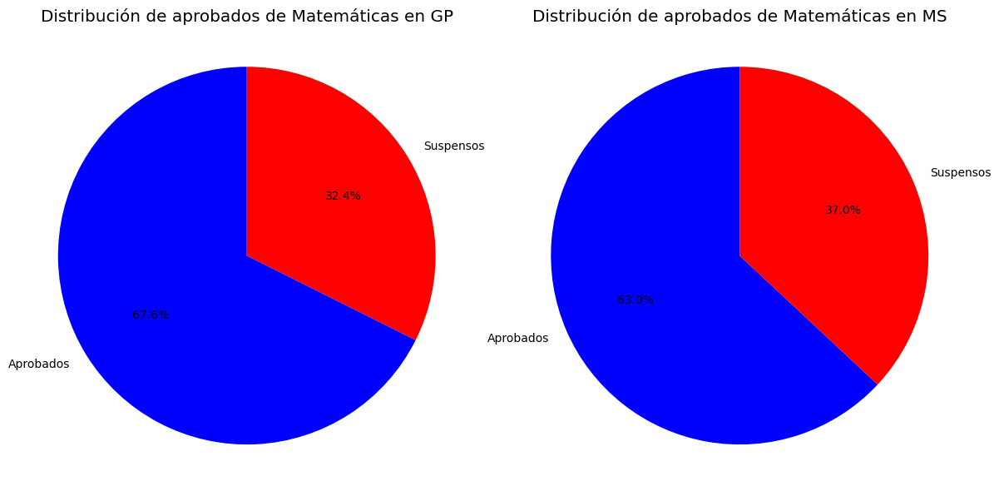

In [45]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb

# Supongamos que df_por ya está definido y contiene la columna G3.

# Crear una columna en `df_por` para categorizar los puntos según el valor de G3
df_por['color'] = df_por['G3'].apply(lambda x: 'Suspensos' if x < 10 else 'Aprobados')

# Calcular la proporción de estudiantes en cada categoría agrupados por escuela
color_counts_by_school = df_por.groupby('school')['color'].value_counts().unstack()
print(color_counts_by_school)

# Crear gráficos de pastel para cada escuela
plt.figure(figsize=(12, 6))

for idx, school in enumerate(color_counts_by_school.index):
    plt.subplot(1, len(color_counts_by_school.index), idx + 1)  # Crear subgráficos
    plt.pie(color_counts_by_school.loc[school], labels=color_counts_by_school.columns, 
            colors=['blue', 'red'], autopct='%1.1f%%', startangle=90)
    plt.title(f'Distribución de aprobados de Matemáticas en {school}')
    plt.axis('equal')

# Ajustar el diseño
plt.tight_layout()
plt.show()


/home/ccanamero/.pyenv/versions/3.11.0/lib/python3.11/site-packages/seaborn/categorical.py:3399: UserWarning: 18.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


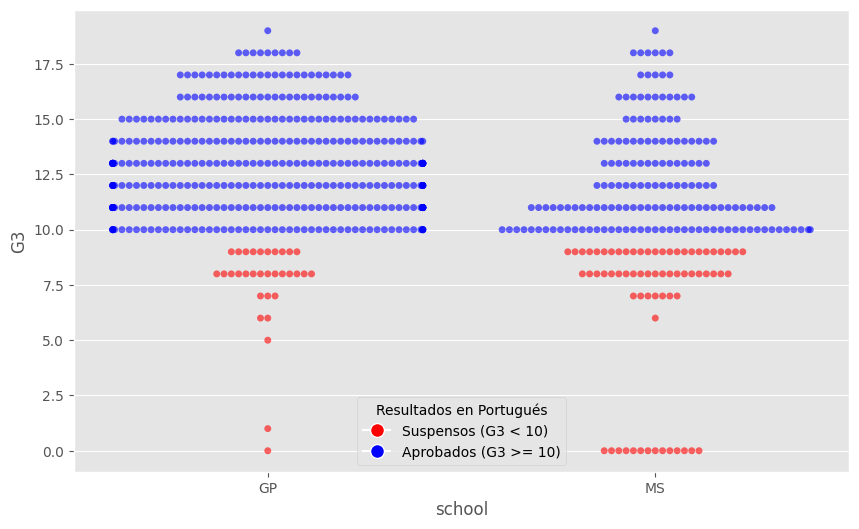

In [54]:
import matplotlib.pyplot as plt
import seaborn as sb
import pandas as pd

# Asegúrate de que 'df_por' es tu DataFrame y tiene la columna 'G3'
# Crear una columna en `df_por` para categorizar los puntos según el valor de G3
df_por['color'] = df_por['G3'].apply(lambda x: 'Suspenso' if x < 10 else 'Aprobado')

# Crear el gráfico de puntos (swarmplot) con la nueva columna de color como hue
plt.figure(figsize=(10, 6))
sb.swarmplot(y="G3", x="school", data=df_por, hue="color", palette={'Suspenso': 'red', 'Aprobado': 'blue'}, alpha=0.6)

# Añadir etiquetas a los ejes
plt.xlabel("school")
plt.ylabel("G3")

# Ajustar la leyenda
plt.legend(title='Resultados en Portugués', labels=['Suspensos (G3 < 10)', 'Aprobados (G3 >= 10)'], 
           handles=[plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=10),
                    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=10)])

plt.show()



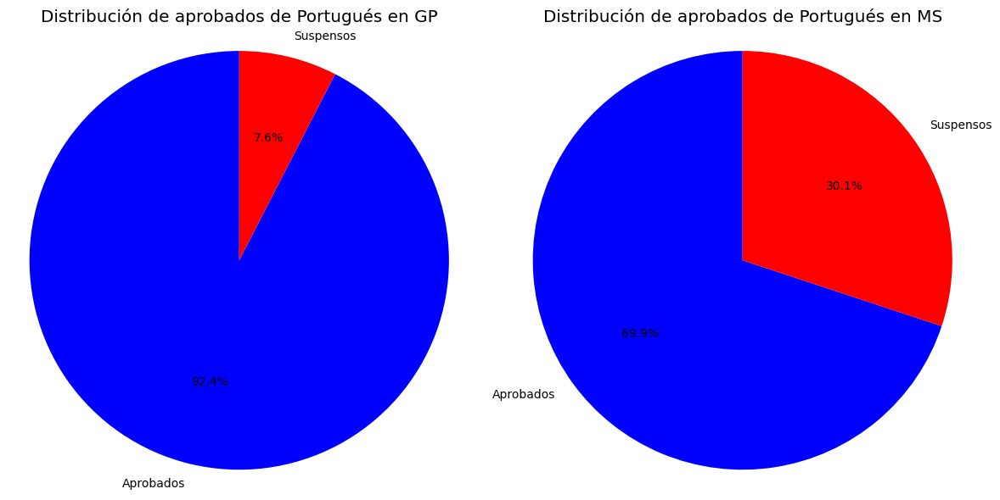

In [56]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb

# Supongamos que df_por ya está definido y contiene la columna G3.

# Crear una columna en `df_por` para categorizar los puntos según el valor de G3
df_por['color'] = df_por['G3'].apply(lambda x: 'Suspensos' if x < 10 else 'Aprobados')

# Calcular la proporción de estudiantes en cada categoría agrupados por escuela
color_counts_by_school = df_por.groupby('school')['color'].value_counts().unstack()

# Crear gráficos de pastel para cada escuela
plt.figure(figsize=(12, 6))

for idx, school in enumerate(color_counts_by_school.index):
    plt.subplot(1, len(color_counts_by_school.index), idx + 1)  # Crear subgráficos
    plt.pie(color_counts_by_school.loc[school], labels=color_counts_by_school.columns,
            colors=['blue', 'red'], autopct='%1.1f%%', startangle=90)
    plt.title(f'Distribución de aprobados de Portugués en {school}')
    plt.axis('equal')

# Ajustar el diseño
plt.tight_layout()
plt.show()